# Importer les bibliothèques nécessaires

In [1]:
from sklearn.feature_selection import SelectKBest, f_regression,f_classif
import time
import numpy as np
import pandas as pd
import seaborn as snsa
import plotly.express as px
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.naive_bayes import GaussianNB
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score,confusion_matrix

# Chargement de données et Analyse initiale

In [2]:
df = pd.read_csv('C:/Users/DELL/Documents/SFE/archive/UNSW_NB15_training-set.csv')
df_initial = df

In [3]:
df.head(4)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 45 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 82332 non-null  int64  
 1   dur                82332 non-null  float64
 2   proto              82332 non-null  object 
 3   service            82332 non-null  object 
 4   state              82332 non-null  object 
 5   spkts              82332 non-null  int64  
 6   dpkts              82332 non-null  int64  
 7   sbytes             82332 non-null  int64  
 8   dbytes             82332 non-null  int64  
 9   rate               82332 non-null  float64
 10  sttl               82332 non-null  int64  
 11  dttl               82332 non-null  int64  
 12  sload              82332 non-null  float64
 13  dload              82332 non-null  float64
 14  sloss              82332 non-null  int64  
 15  dloss              82332 non-null  int64  
 16  sinpkt             823

In [5]:
df.describe(include='number')

,id,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,82332.000000,82332.000000,82332.000000,82332.000000,8.233200e+04,8.233200e+04,8.233200e+04,82332.000000,82332.000000,8.233200e+04,...,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000
mean,41166.500000,1.006756,18.666472,17.545936,7.993908e+03,1.323379e+04,8.241089e+04,180.967667,95.713003,6.454902e+07,...,4.928898,3.663011,7.456360,0.008284,0.008381,0.129743,6.468360,9.164262,0.011126,0.550600
std,23767.345519,4.710444,133.916353,115.574086,1.716423e+05,1.514715e+05,1.486204e+05,101.513358,116.667722,1.798618e+08,...,8.389545,5.915386,11.415191,0.091171,0.092485,0.638683,8.543927,11.121413,0.104891,0.497436
min,1.000000,0.000000,1.000000,0.000000,2.400000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,20583.750000,0.000008,2.000000,0.000000,1.140000e+02,0.000000e+00,2.860611e+01,62.000000,0.000000,1.120247e+04,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000
50%,41166.500000,0.014138,6.000000,2.000000,5.340000e+02,1.780000e+02,2.650177e+03,254.000000,29.000000,5.770032e+05,...,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,5.000000,0.000000,1.000000
75%,61749.250000,0.719360,12.000000,10.000000,1.280000e+03,9.560000e+02,1.111111e+05,254.000000,252.000000,6.514286e+07,...,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,7.000000,11.000000,0.000000,1.000000
max,82332.000000,59.999989,10646.000000,11018.000000,1.435577e+07,1.465753e+07,1.000000e+06,255.000000,253.000000,5.268000e+09,...,59.000000,38.000000,63.000000,2.000000,2.000000,16.000000,60.000000,62.000000,1.000000,1.000000


In [6]:
df.describe(include='object')

,proto,service,state,attack_cat
count,82332,82332,82332,82332
unique,131,13,7,10
top,tcp,-,FIN,Normal
freq,43095,47153,39339,37000


In [7]:
df.isnull().sum()

id                   0
dur                  0
proto                0
service              0
state                0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat 

In [8]:
df.duplicated().sum()

0

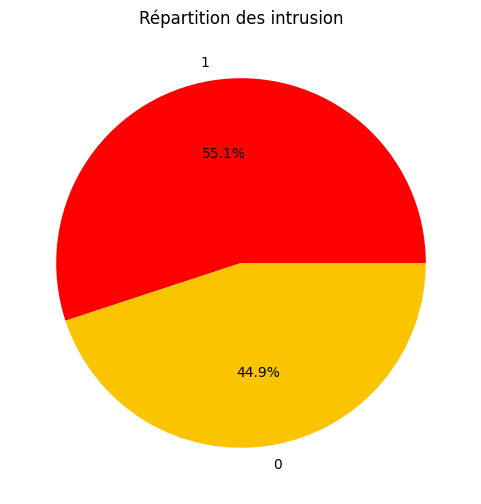

In [9]:
# Visualisation de la répartition des niveaux avec un graphique circulaire
colors=['red','#FAC500']
plt.figure(figsize=(6, 6))
df['label'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=colors)
plt.title('Répartition des intrusion')
plt.ylabel('')
plt.show()

# Data preprocessing and cleaning

In [10]:
# Drop useless columns
list_drop = ['id' , 'attack_cat']
df.drop(list_drop, axis = 1, inplace = True)

In [11]:
# Check if 'id' and 'attack_cat' have been dropped
df.columns

Index(['dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'label'],
      dtype='object')

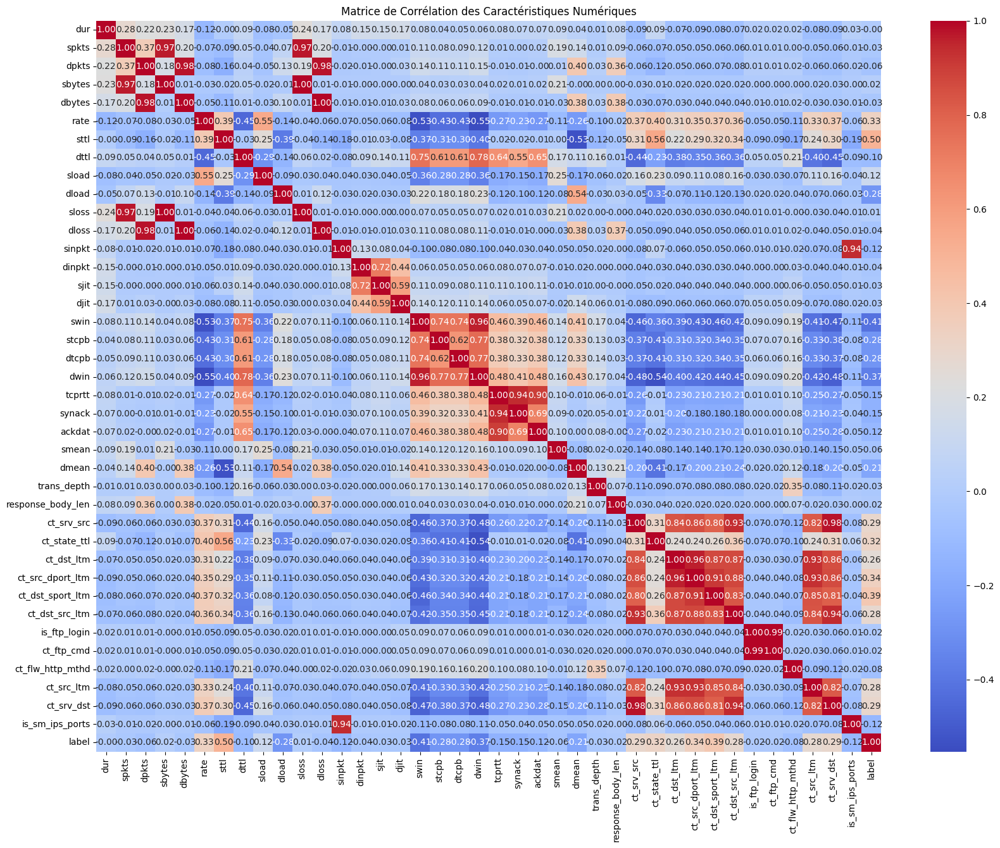

In [12]:
# Correlation matrix
df_numeric=df.select_dtypes(include='number')
correlation_matrix = df_numeric.corr()
plt.figure(figsize=(20, 15))
snsa.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Matrice de Corrélation des Caractéristiques Numériques')
plt.show()

## Reduce the labels in catagorical features

Pour éviter une explosion de la dimensionnalité, cette étape vise à réduire le nombre de libellés dans les caractéristiques catégorielles à 5 ou 6 par caractéristique. Cela signifie qu'au lieu d'avoir de nombreux libellés uniques, seuls les 5 ou 6 libellés les plus fréquents seront conservés, tandis que les autres seront regroupés sous une catégorie commune, souvent notée '-' pour indiquer qu'ils sont rarement utilisés.

In [13]:
# Avant la reduction
df_cat = df.select_dtypes(exclude=[np.number])
df_cat.describe(include='all')

,proto,service,state
count,82332,82332,82332
unique,131,13,7
top,tcp,-,FIN
freq,43095,47153,39339


In [14]:
# Reduction de la cardinalité
df_cat = df.select_dtypes(exclude=[np.number])
for feature in df_cat.columns:
    if df_cat[feature].nunique() > 6:
        top_labels = df_cat[feature].value_counts().nlargest(5).index
        df[feature] = df[feature].apply(lambda x: x if x in top_labels else '-')

# Re-sélection des caractéristiques catégorielles pour vérification
df_cat = df.select_dtypes(exclude=[np.number])
df_cat.describe(include='all')

,proto,service,state
count,82332,82332,82332
unique,6,5,6
top,tcp,-,FIN
freq,43095,49275,39339


In [15]:
# Categories distribution
for col in df_cat.columns:
    fig = px.histogram(df_cat, x = col, title = f"Distribution of {col} after cardinality reduction")
    fig.show()

In [16]:
# Calcul de la variance
df_numeric = df.select_dtypes(include=[np.number])
variance = df_numeric.var()
variance

dur                  2.218829e+01
spkts                1.793359e+04
dpkts                1.335737e+04
sbytes               2.946107e+10
dbytes               2.294360e+10
rate                 2.208801e+10
sttl                 1.030496e+04
dttl                 1.361136e+04
sload                3.235028e+16
dload                5.726452e+12
sloss                4.179573e+03
dloss                3.103384e+03
sinpkt               3.822474e+07
dinpkt               1.670242e+06
sjit                 3.217614e+09
djit                 1.321545e+07
swin                 1.621981e+04
stcpb                1.934491e+18
dtcpb                1.909913e+18
dwin                 1.625405e+04
tcprtt               1.346105e-02
synack               5.020221e-03
ackdat               3.035298e-03
smean                4.346060e+04
dmean                5.982929e+04
trans_depth          2.947641e-01
response_body_len    1.449094e+09
ct_srv_src           1.229945e+02
ct_state_ttl         1.138890e+00
ct_dst_ltm    

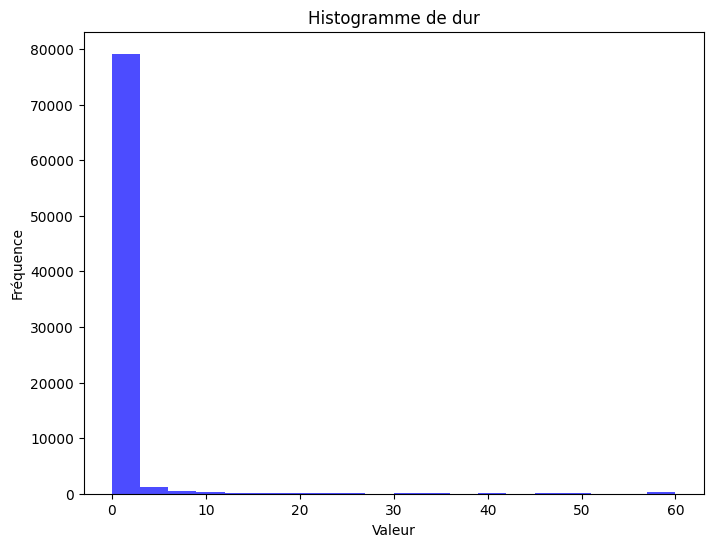

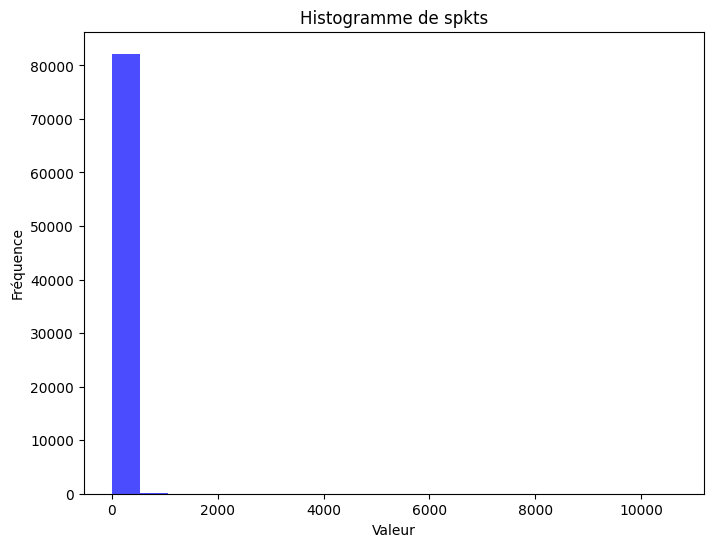

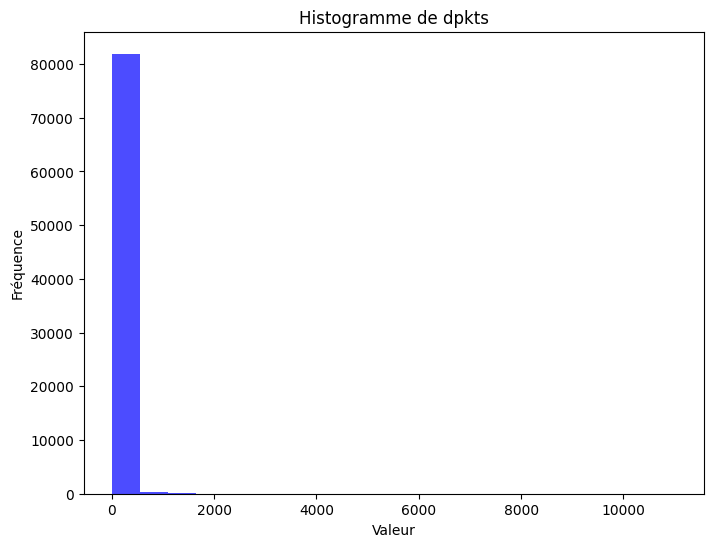

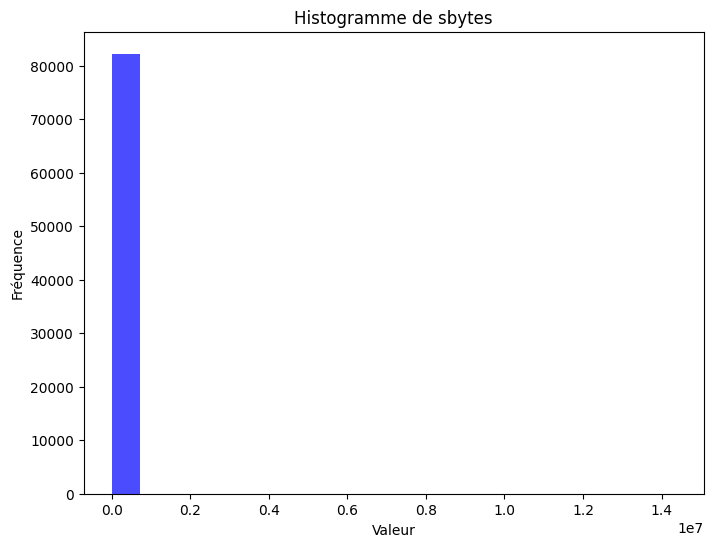

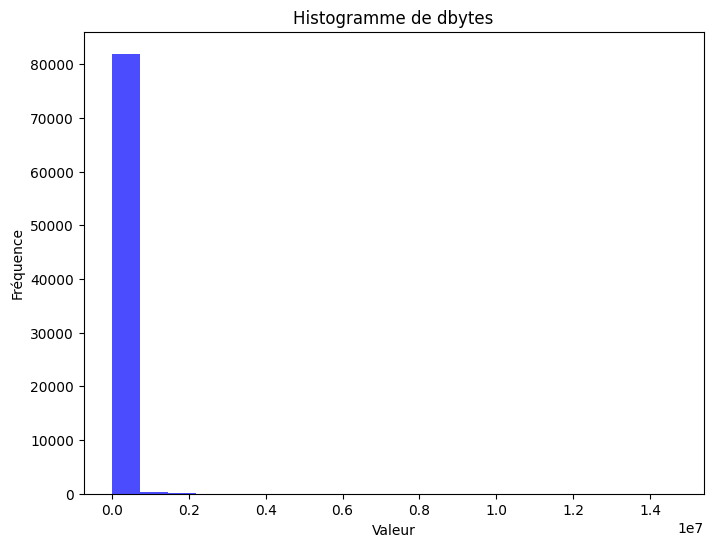

...

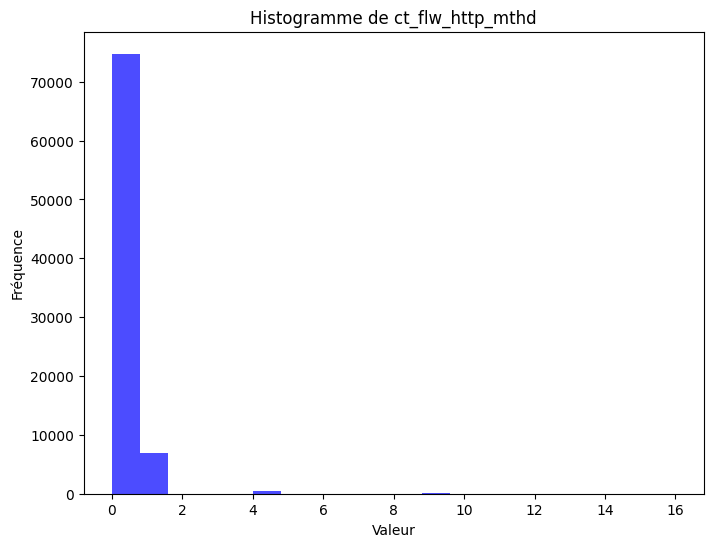

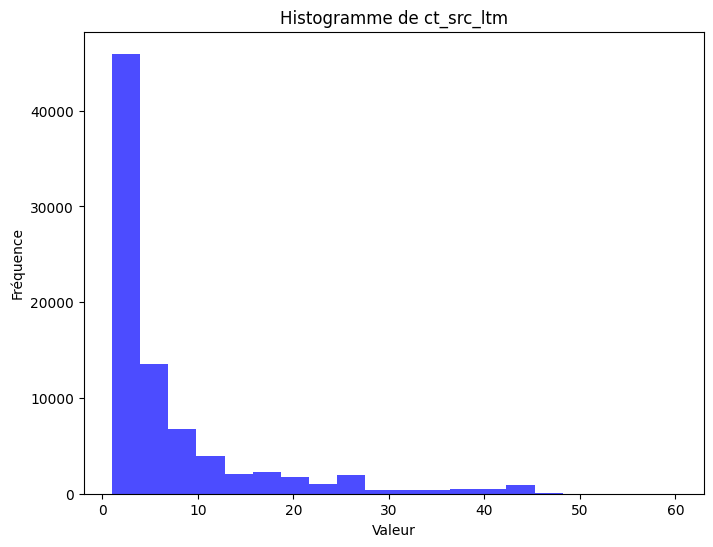

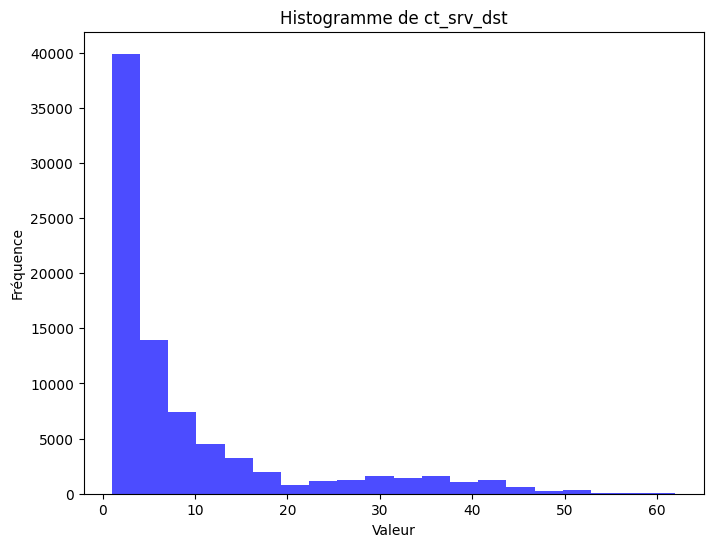

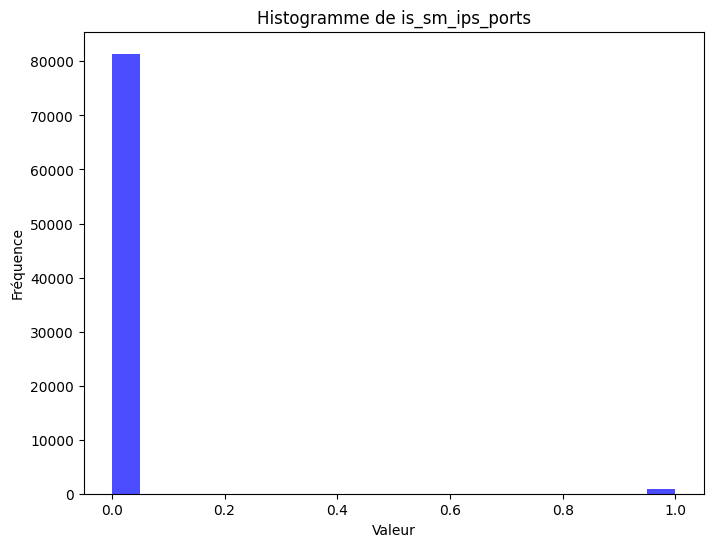

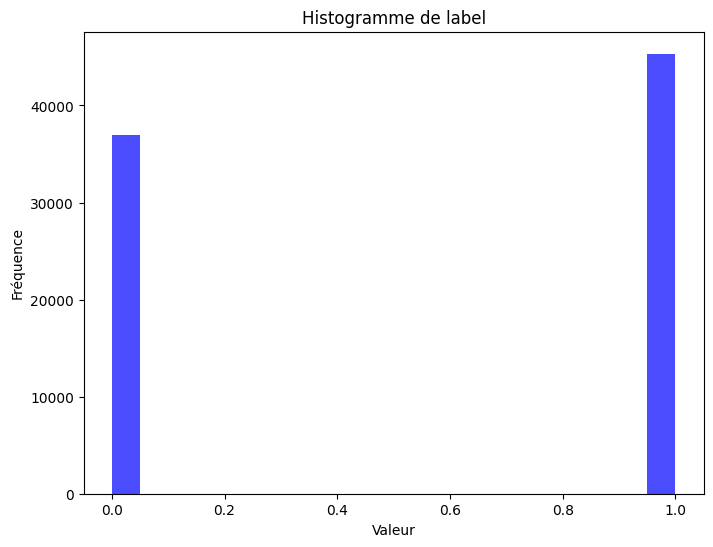

In [17]:
# Distributions pour chaque caractéristique
df_numeric = df.select_dtypes(include='number')
for feature in df_numeric.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(df_numeric[feature], bins=20, color='blue', alpha=0.7)
    plt.xlabel('Valeur')
    plt.ylabel('Fréquence')
    plt.title('Histogramme de {}'.format(feature))
    plt.show()

## Data Clamping

Cette fonction prend un DataFrame df en entrée et applique le clamping aux colonnes numériques de ce DataFrame. Elle itère sur chaque colonne numérique du DataFrame. Pour chaque colonne, elle calcule la médiane (median) et la valeur maximale (max_value). Si la valeur maximale est plus de 10 fois supérieure à la médiane, cela indique une forte présence de valeurs extrêmes dans cette colonne. Dans ce cas, elle calcule le 95e percentile (percentile_95) de la colonne. Si ce 95e percentile est inférieur à la valeur maximale, cela signifie que le 95e percentile est plus proche de la médiane que la valeur maximale, donc il est utilisé comme nouvelle valeur maximale. Elle applique cette nouvelle valeur maximale à toutes les valeurs de la colonne qui sont supérieures à cette valeur maximale.
En résumé, cette étape du code vise àlimiter l'impact des valeurs extrêmes dans les données en les ajustant de manière appropriée, ce qui aide à améliorer la qualité des données pour la modélisation.

Si la moyenne (mean) est plus grande que la médiane (50th percentile) -> une asymétrie positive. Si la distribution est parfaitement symétrique, la médiane sera égale à la moyenne. Si le quartile 75% est plus proche du maximum que du minimum, cela renforce l'indication d'une asymétrie positive (le quartile 75% est plus proche du maximum pour la plupart des caractéristiques, ce qui confirme l'asymétrie positive).

In [18]:
def apply_clamping(df):
    for column in df.select_dtypes(include=[np.number]).columns:
        median = df[column].median()
        max_value = df[column].max()
        if max_value > 10 * median:
            percentile_95 = df[column].quantile(0.95)
            if percentile_95 < max_value:
                df[column] = df[column].apply(lambda x: min(x, percentile_95))
    return df

In [19]:
# Application de la contrainte aux données
df = apply_clamping(df)

In [20]:
# Affichage des statistiques descriptives après contrainte
df_numeric_clamped = df.select_dtypes(include = [np.number])
df_numeric_clamped.describe(include='all')

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,82332.000000,82332.00000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,8.233200e+04,8.233200e+04,...,82332.000000,82332.000000,82332.000000,82332.0,82332.0,82332.000000,82332.000000,82332.000000,82332.0,82332.000000
mean,0.445016,11.84186,9.178424,1580.566135,2866.918367,71576.702810,180.967667,95.713003,4.649418e+07,3.105380e+05,...,4.466611,3.388901,7.160679,0.0,0.0,0.092066,5.974809,8.832532,0.0,0.550600
std,0.672222,15.66461,14.504212,2948.850472,7525.606738,102631.946851,101.513358,116.667722,7.417784e+07,8.918691e+05,...,6.685037,5.029129,10.481621,0.0,0.0,0.289121,6.867156,10.124902,0.0,0.497436
min,0.000000,1.00000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,...,1.000000,1.000000,1.000000,0.0,0.0,0.000000,1.000000,1.000000,0.0,0.000000
25%,0.000008,2.00000,0.000000,114.000000,0.000000,28.606114,62.000000,0.000000,1.120247e+04,0.000000e+00,...,1.000000,1.000000,1.000000,0.0,0.0,0.000000,1.000000,2.000000,0.0,0.000000
50%,0.014138,6.00000,2.000000,534.000000,178.000000,2650.176667,254.000000,29.000000,5.770032e+05,2.112951e+03,...,1.000000,1.000000,3.000000,0.0,0.0,0.000000,3.000000,5.000000,0.0,1.000000
75%,0.719360,12.00000,10.000000,1280.000000,956.000000,111111.107200,254.000000,252.000000,6.514286e+07,1.585808e+04,...,4.000000,3.000000,6.000000,0.0,0.0,0.000000,7.000000,11.000000,0.0,1.000000
max,2.403792,60.00000,54.000000,12472.000000,30622.000000,333333.321500,255.000000,253.000000,2.666667e+08,3.741446e+06,...,25.000000,18.000000,37.000000,0.0,0.0,1.000000,25.000000,36.000000,0.0,1.000000


## Logarithmic Transformation

La fonction logarithmique est utilisée pour compresser les valeurs élevées et étirer les valeurs basses d'une distribution, ce qui aide à réduire l'asymétrie et à rendre la distribution plus proche de la symétrie.
Au lieu d'appliquer la fonction logarithmique individuellement à chaque caractéristique numérique, une règle simple a été établie. Selon cette règle, si le nombre de valeurs uniques dans une caractéristique continue est supérieur à 50, alors la fonction logarithmique est appliquée à cette caractéristique.

In [21]:
# Vérifier les colonnes numériques pour les zéros ou les valeurs négatives

numeric_cols = df.select_dtypes(include=['number']).columns
negative_values = (df[numeric_cols] < 0).any()

print("Des valeurs négatives :\n", negative_values)

# Vérifier les colonnes pour les zéros
zero_values = (df[numeric_cols] == 0).any()
print("\n Des zéros :\n", zero_values)

Des valeurs négatives :
 dur                  False
spkts                False
dpkts                False
sbytes               False
dbytes               False
rate                 False
sttl                 False
dttl                 False
sload                False
dload                False
sloss                False
dloss                False
sinpkt               False
dinpkt               False
sjit                 False
djit                 False
swin                 False
stcpb                False
dtcpb                False
dwin                 False
tcprtt               False
synack               False
ackdat               False
smean                False
dmean                False
trans_depth          False
response_body_len    False
ct_srv_src           False
ct_state_ttl         False
ct_dst_ltm           False
ct_src_dport_ltm     False
ct_dst_sport_ltm     False
ct_dst_src_ltm       False
is_ftp_login         False
ct_ftp_cmd           False
ct_flw_http_mthd     False
ct_

In [22]:
# Sélection des caractéristiques numériques
df_numeric = df.select_dtypes(include=[np.number])

# Copie du DataFrame caractéristiques numériques original
df_before = df.copy()

# Application de la transformation logarithmique
# np.log(x + 1) is used instead of np.log1p(x), because some features contain 'zero' values
df_numeric = df_numeric.apply(lambda x: np.log(x + 1) if x.nunique() > 50 else x)

# Affichage des statistiques descriptives après transformation logarithmique
df_numeric.describe(include='all')

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,...,82332.000000,82332.000000,82332.000000,82332.0,82332.0,82332.000000,82332.000000,82332.000000,82332.0,82332.000000
mean,0.285416,2.007512,1.396991,6.250926,3.938930,7.480228,180.967667,95.713003,13.549943,5.800992,...,4.466611,3.388901,7.160679,0.0,0.0,0.092066,5.974809,8.832532,0.0,0.550600
std,0.381427,0.990567,1.385679,1.438524,3.700028,4.099853,101.513358,116.667722,4.501575,5.512759,...,6.685037,5.029129,10.481621,0.0,0.0,0.289121,6.867156,10.124902,0.0,0.497436
min,0.000000,0.693147,0.000000,3.218876,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.0,0.0,0.000000,1.000000,1.000000,0.0,0.000000
25%,0.000008,1.098612,0.000000,4.744932,0.000000,3.387981,62.000000,0.000000,9.323979,0.000000,...,1.000000,1.000000,1.000000,0.0,0.0,0.000000,1.000000,2.000000,0.0,0.000000
50%,0.014039,1.945910,1.098612,6.282267,5.187386,7.882759,254.000000,29.000000,13.265605,7.656314,...,1.000000,1.000000,3.000000,0.0,0.0,0.000000,3.000000,5.000000,0.0,1.000000
75%,0.541952,2.564949,2.397895,7.155396,6.863803,11.618295,254.000000,252.000000,17.992093,9.671498,...,4.000000,3.000000,6.000000,0.0,0.0,0.000000,7.000000,11.000000,0.0,1.000000
max,1.224890,4.110874,4.007333,9.431322,10.329507,12.716901,255.000000,253.000000,19.401510,15.134983,...,25.000000,18.000000,37.000000,0.0,0.0,1.000000,25.000000,36.000000,0.0,1.000000


In [23]:
# Réintégrer les colonnes numériques transformées dans le dataframe principal
df[df_numeric.columns] = df_numeric

In [24]:
# Visualiser la distribution avant et après la transformation logarithmique
for column in df_numeric.columns:
    fig = go.Figure()

    fig.add_trace(go.Histogram(x = df_before[column], nbinsx=100, name=f"{column} before log transformation"))
    fig.add_trace(go.Histogram(x = df_numeric[column], nbinsx=100, name=f"{column} after log transformation"))

    # Superposer les histogrammes
    fig.update_layout(barmode='overlay', title=f"Distribution of {column} before and after log transformation")
    fig.update_traces(opacity=0.75)
 

In [25]:
    fig.show()

## Data Splitting

In [26]:
# X, y splitting
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

In [27]:
X.sample(5)

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports
35847,0.033445,tcp,-,FIN,4.110874,4.007333,8.423102,10.329507,8.437534,31,...,2.0,1.0,1.0,1.0,0.0,0.0,0.0,4.0,2.0,0.0
61610,1.224890,tcp,-,FIN,4.110874,3.433987,9.431322,7.665285,3.928327,62,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
65657,0.769730,tcp,-,FIN,2.564949,2.397895,7.315218,6.660575,2.950536,254,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,5.0,0.0
18259,0.000009,udp,dns,INT,1.098612,0.000000,4.744932,0.000000,11.618295,254,...,19.0,18.0,18.0,27.0,0.0,0.0,0.0,19.0,26.0,0.0
71216,0.265247,tcp,-,FIN,2.397895,1.945910,6.282267,5.594711,3.919639,254,...,1.0,1.0,1.0,4.0,0.0,0.0,0.0,1.0,4.0,0.0


In [28]:
y.sample(5)

34252    0
71035    0
10489    1
30054    0
14560    1
Name: label, dtype: int64

In [29]:
#Suppression des caractéristiques constantes
constant_columns = [col for col in X.columns if X[col].nunique() <= 1]
X.drop(columns=constant_columns, inplace=True)


In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0, stratify = y)
print('X_train shape:', X_train.shape)
print('y_train shape:', y_train.shape)
print('X_test shape:', X_test.shape)
print('y_test shape:', y_test.shape)

X_train shape: (65865, 39)
y_train shape: (65865,)
X_test shape: (16467, 39)
y_test shape: (16467,)


## ColumnTransformer

L'encodage one-hot est particulièrement utile lorsque les catégories n'ont pas de relation d'ordre entre elles (ce qui est souvent le cas pour les caractéristiques catégorielles).

In [31]:
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

In [32]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])


In [33]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('selector', SelectKBest(score_func=f_classif, k=10))
])

In [34]:
# Fit and transform the training data
X_train = pipeline.fit_transform(X_train, y_train)
X_test = pipeline.transform(X_test) 


## Model creation

In [35]:
# Fonction pour évaluer et collecter les performances des modèles
def evaluate_model(model, model_name, X_train, y_train, X_test, y_test):
    start_time = time.time()
    model.fit(X_train, y_train)
    training_time = time.time() - start_time

    start_time = time.time()
    y_pred = model.predict(X_test)
    prediction_time = time.time() - start_time

    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    print(f"{model_name} Performance:")
    print(f"Accuracy: {accuracy}")
    print(f"Recall: {recall}")
    print(f"Precision: {precision}")
    print(f"F1-Score: {f1}")
    print(f"Training Time: {training_time}")
    print(f"Prediction Time: {prediction_time}\n")

    # Affichage de la matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix = cm)
    disp.plot()
    plt.title(f"{model_name} Confusion Matrix")
    plt.show()

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Recall': recall,
        'Precision': precision,
        'F1-Score': f1,
        'Training Time': training_time,
        'Prediction Time': prediction_time
    }

In [36]:
# Initialisation de la liste des résultats
results = []

In [37]:
# Liste des modèles à évaluer
models = [
    (GaussianNB(), 'Gaussian Naive Bayes'),
    (LogisticRegression(random_state=0, max_iter=500), 'Logistic Regression'),
    (DecisionTreeClassifier(random_state=0), 'Decision Tree'),
    (KNeighborsClassifier(), 'kNN'),
    (RandomForestClassifier(random_state=0), 'Random Forest')
]

Gaussian Naive Bayes Performance:
Accuracy: 0.7371105848059756
Recall: 0.7452272422416902
Precision: 0.7457257194589759
F1-Score: 0.7371046862856678
Training Time: 0.04689359664916992
Prediction Time: 0.015655040740966797



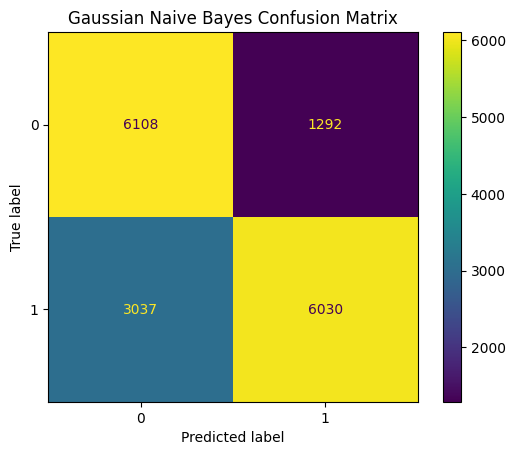

Logistic Regression Performance:
Accuracy: 0.7635877816238538
Recall: 0.7625374613612178
Precision: 0.7612740385863297
F1-Score: 0.7617608822714279
Training Time: 0.4945254325866699
Prediction Time: 0.0



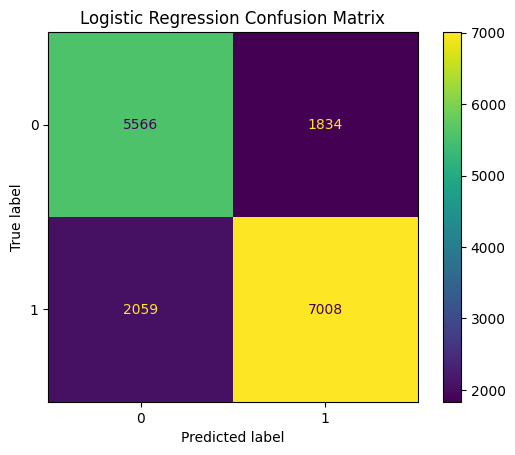

Decision Tree Performance:
Accuracy: 0.9087265439970851
Recall: 0.909824989045514
Precision: 0.9071537355735093
F1-Score: 0.9081199410428362
Training Time: 0.47187376022338867
Prediction Time: 0.0



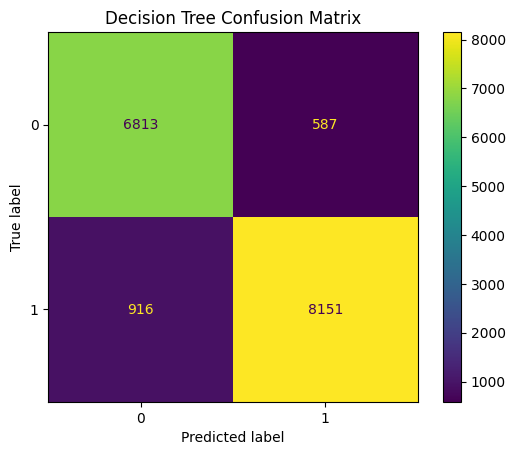

kNN Performance:
Accuracy: 0.9132811076698852
Recall: 0.9153894580584776
Precision: 0.9118746642818598
F1-Score: 0.912831222712118
Training Time: 0.31403446197509766
Prediction Time: 3.767284393310547



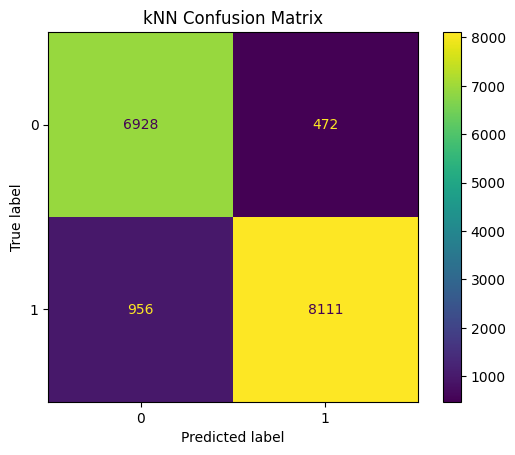

Random Forest Performance:
Accuracy: 0.9180178538895973
Recall: 0.9198646860161143
Precision: 0.9165425543067416
F1-Score: 0.9175556237942337
Training Time: 14.027094602584839
Prediction Time: 0.47818636894226074



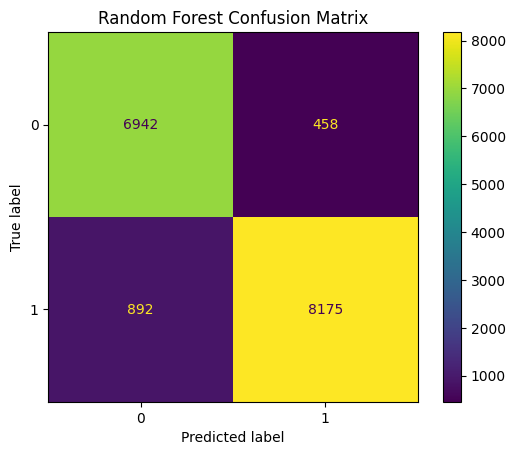

In [38]:
# Évaluation des modèles
for model, name in models:
    result = evaluate_model(model, name, X_train, y_train, X_test, y_test)
    results.append(result)

In [39]:
# Création d'un DataFrame pour stocker les performances des modèles
results_df = pd.DataFrame(results)
sorted_results_df = results_df.sort_values(by='F1-Score', ascending=False)
sorted_results_df

,Model,Accuracy,Recall,Precision,F1-Score,Training Time,Prediction Time
4,Random Forest,0.918018,0.919865,0.916543,0.917556,14.027095,0.478186
3,kNN,0.913281,0.915389,0.911875,0.912831,0.314034,3.767284
2,Decision Tree,0.908727,0.909825,0.907154,0.908120,0.471874,0.000000
1,Logistic Regression,0.763588,0.762537,0.761274,0.761761,0.494525,0.000000
0,Gaussian Naive Bayes,0.737111,0.745227,0.745726,0.737105,0.046894,0.015655


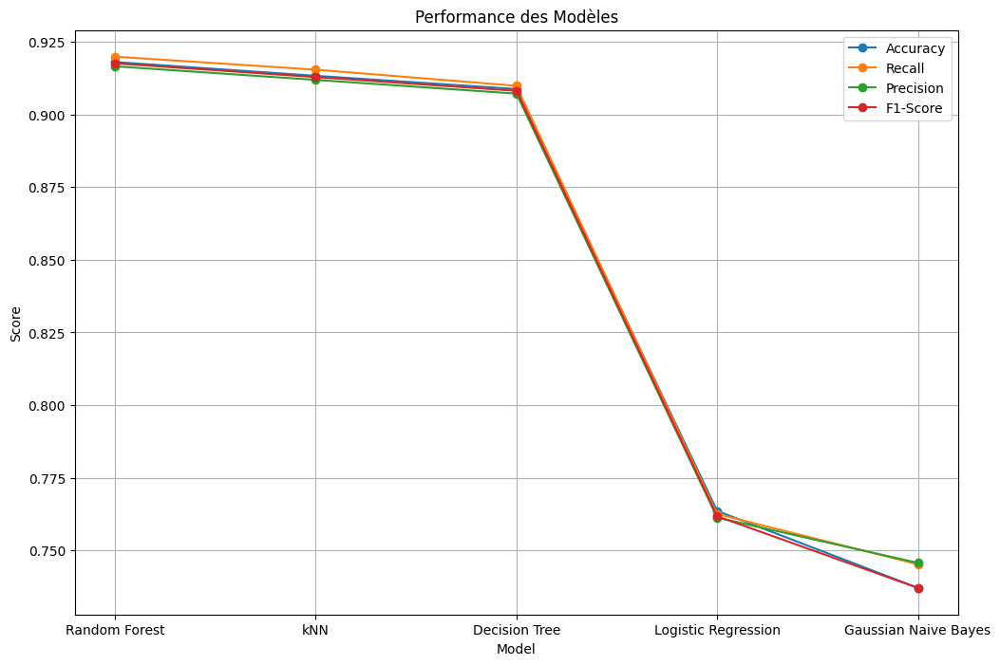

In [40]:
# Diagramme pour classifier les modèles selon leurs performances
plt.figure(figsize=(12, 8))
for metric in ['Accuracy', 'Recall', 'Precision', 'F1-Score']:
    plt.plot(sorted_results_df['Model'], sorted_results_df[metric], marker='o', label=metric)

plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Performance des Modèles')
plt.legend()
plt.grid(True)
plt.show()